In [1]:
import pandas as pd
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
import plotly.express as px
from statsmodels.graphics.mosaicplot import mosaic
from pandas.plotting import parallel_coordinates
import plotly.graph_objects as go
%matplotlib inline

In [2]:
df = pd.read_csv("adult_data.txt", header=None, sep=", ")
df.columns = ["age", "workclass", "fnlwgt", "education", "education-num", "marital-status", "occupation", "relationship", "race", "sex", "capital-gain", "capital-loss", "hours-per-week", "native-country", "salary"]

<ipython-input-2-d82e95f79c19>:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  df = pd.read_csv("adult_data.txt", header=None, sep=", ")


In [3]:
df = df.replace('?', np.nan)
# Gives the count in each column with missing values
df.isnull().sum()

age                  0
workclass         1836
fnlwgt               0
education            0
education-num        0
marital-status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital-gain         0
capital-loss         0
hours-per-week       0
native-country     583
salary               0
dtype: int64

In [5]:
#Dropping missing values
count_beforedrop = df.shape[0]
df.dropna(inplace=True)
count_afterdrop = df.shape[0]
print('Number of rows before dropping the missing values ',count_beforedrop)
print('Number of rows after removing the missing data ',count_afterdrop)

Number of rows before dropping the missing values  32561
Number of rows after removing the missing data  30162


In [6]:
#Trying to find correlation between continous varaibles
df[['age','education-num','capital-gain','capital-loss','hours-per-week']].corr()

,age,education-num,capital-gain,capital-loss,hours-per-week
age,1.000000,0.043526,0.080154,0.060165,0.101599
education-num,0.043526,1.000000,0.124416,0.079646,0.152522
capital-gain,0.080154,0.124416,1.000000,-0.032229,0.080432
capital-loss,0.060165,0.079646,-0.032229,1.000000,0.052417
hours-per-week,0.101599,0.152522,0.080432,0.052417,1.000000


In [7]:
#Selecting features
#Dropping columns fnlwgt,
#education similar to education-num Merging and created new
#Marital status or relationship -Choosing one

df.drop(columns=['fnlwgt', 'education-num'])

,age,workclass,education,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,salary
0,39,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,11th,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,Assoc-acdm,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,HS-grad,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,HS-grad,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,HS-grad,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [8]:
df.head()


,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,salary
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [9]:
df.education.unique()

array(['Bachelors', 'HS-grad', '11th', 'Masters', '9th', 'Some-college',
       'Assoc-acdm', '7th-8th', 'Doctorate', 'Assoc-voc', 'Prof-school',
       '5th-6th', '10th', 'Preschool', '12th', '1st-4th'], dtype=object)

In [10]:
list_=[(i,k) for i,k in zip(df['education-num'].unique(),df.education.unique())]
print(list_)

[(13, 'Bachelors'), (9, 'HS-grad'), (7, '11th'), (14, 'Masters'), (5, '9th'), (10, 'Some-college'), (12, 'Assoc-acdm'), (4, '7th-8th'), (16, 'Doctorate'), (11, 'Assoc-voc'), (15, 'Prof-school'), (3, '5th-6th'), (6, '10th'), (1, 'Preschool'), (8, '12th'), (2, '1st-4th')]


In [11]:
# There are 13 different categories in education, so reduced it to 7 categories by grouping different education levels
conditions = [(df['education-num'] >= 16) ,
              (df['education-num'] >= 14) & (df['education-num'] < 16),
              (df['education-num'] == 13) ,
              (df['education-num'] >= 10) & (df['education-num'] < 13),
              (df['education-num'] == 9) ,
              (df['education-num'] >= 7) & (df['education-num'] < 9),
              (df['education-num'] < 7)]

values = ['Advanced Degree','Graduate','Undergrad','Associate degree', 'High School Grad','High School Dropout','Junior High and Elementary']
df['education_levels'] = np.select(conditions, values)
df.drop(columns=['education','education-num','fnlwgt'],inplace=True)

In [12]:
#Dividing the data based on income
df_above50 = df[df['salary']=='>50K']
df_below50 = df[df['salary']=='<=50K']

In [13]:
df['education_levels'].unique()


array(['Undergrad', 'High School Grad', 'High School Dropout', 'Graduate',
       'Junior High and Elementary', 'Associate degree',
       'Advanced Degree'], dtype=object)

In [14]:
count_education = df.groupby('education_levels').count()

In [15]:
count_education.index
list_edu = count_education['salary']

Text(0.5, 1.0, 'Education distribution in salary more than 50k \n\n')

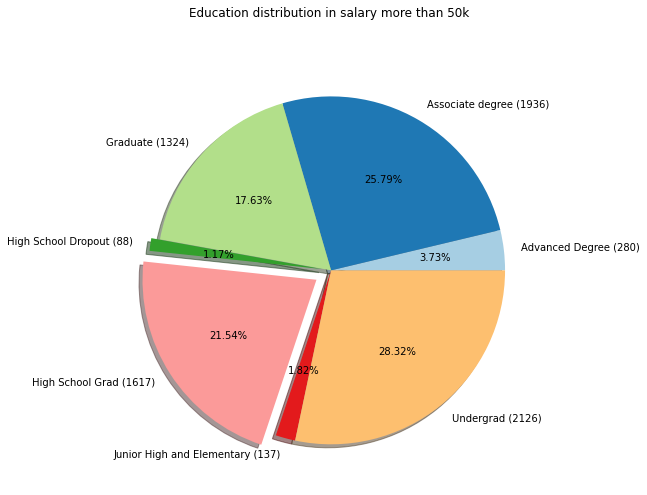

In [16]:
explode_ = (0, 0, 0, 0.05,0.1,0 ,0)
count_education = df_above50.groupby('education_levels').count()
fig = plt.figure(figsize=(20,8))
#colors_ = ['#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69','#fccde5','#2b8cbe']
colors_pop =['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
labels_ = ["{} ({})".format(i,j) for i,j in zip(count_education.index,count_education['salary']) ]
plt.pie(count_education['salary'],labels=labels_,explode=explode_,colors=colors_pop, autopct='%1.2f%%',shadow=True)
plt.title('Education distribution in salary more than 50k \n\n')

Text(0.5, 1.0, 'Education distribution in salary less than 50k \n\n')

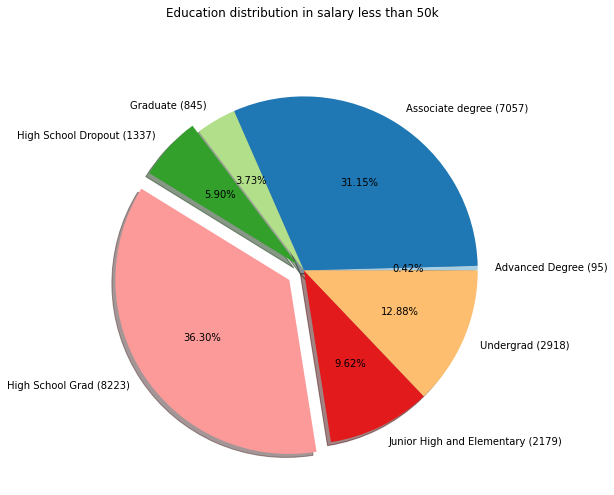

In [17]:
# 1. Pie chart to show the that more % of people with high school degree are earning less than 50k
explode_ = (0, 0, 0, 0.05,0.1,0 ,0)
count_education = df_below50.groupby('education_levels').count()
fig = plt.figure(figsize=(20,8))
#colors_ = ['#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69','#fccde5','#2b8cbe']
colors_pop =['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
labels_ = ["{} ({})".format(i,j) for i,j in zip(count_education.index,count_education['salary']) ]
plt.pie(count_education['salary'],labels=labels_,explode=explode_,colors=colors_pop, autopct='%1.2f%%',shadow=True)
plt.title('Education distribution in salary less than 50k \n\n')

Text(0.5, 1.0, 'Education distribution \n\n')

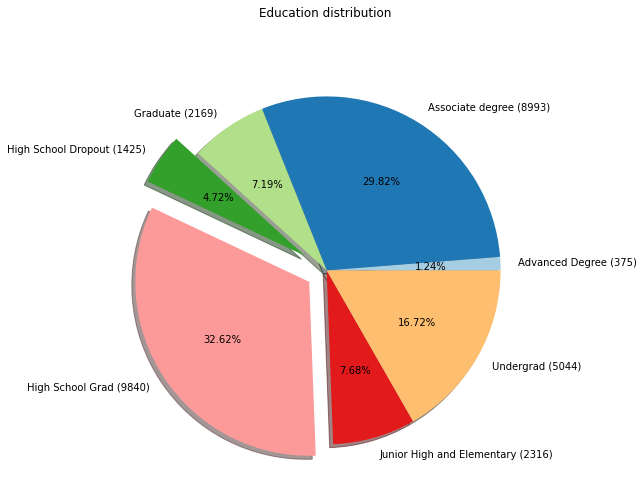

In [18]:
explode_ = (0, 0, 0, 0.15,0.12,0 ,0)
count_education = df.groupby('education_levels').count()
fig = plt.figure(figsize=(20,8))
#colors_ = ['#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69','#fccde5','#2b8cbe']
colors_pop =['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
labels_ = ["{} ({})".format(i,j) for i,j in zip(count_education.index,count_education['salary']) ]
plt.pie(count_education['salary'],labels=labels_,explode=explode_,colors=colors_pop, autopct='%1.2f%%',shadow=True)
plt.title('Education distribution \n\n')

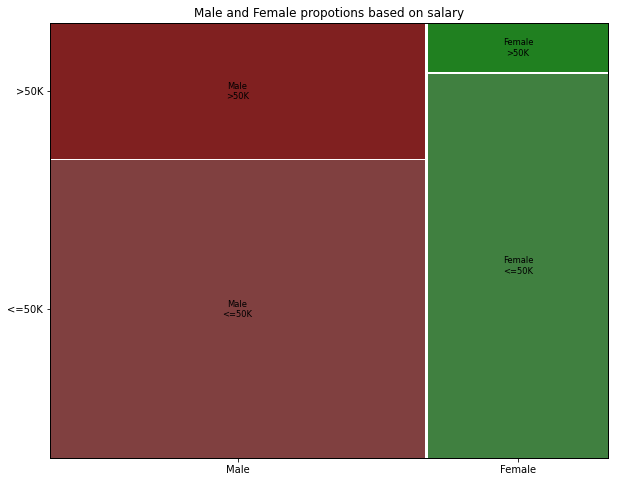

In [19]:
# 2.MOSAIC PLOT TO SEE THE DISTRIBUTION BASED ON SEX and Salary
fig, ax = plt.subplots(figsize=(10, 8))
mosaic(df, ['sex','salary'],ax=ax,title="Male and Female propotions based on salary")
plt.show()

Text(0, 0.5, 'Age')

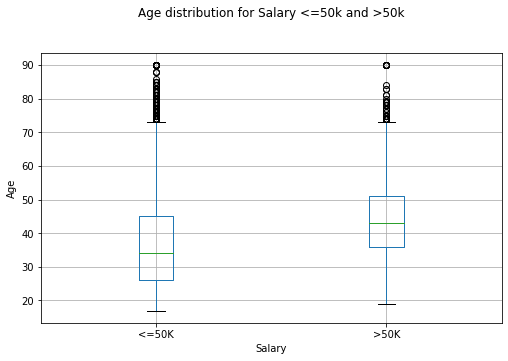

In [20]:
# 3. Box plot to show age distribution for salaries more than 50k and less than 50k

box_plot=df.boxplot(column='age', by='salary', figsize=(8,5))
box_plot.get_figure().suptitle('')
box_plot.get_figure().gca().set_title("Age distribution for Salary <=50k and >50k\n\n")
box_plot.get_figure().gca().set_xlabel('Salary')
box_plot.get_figure().gca().set_ylabel('Age')


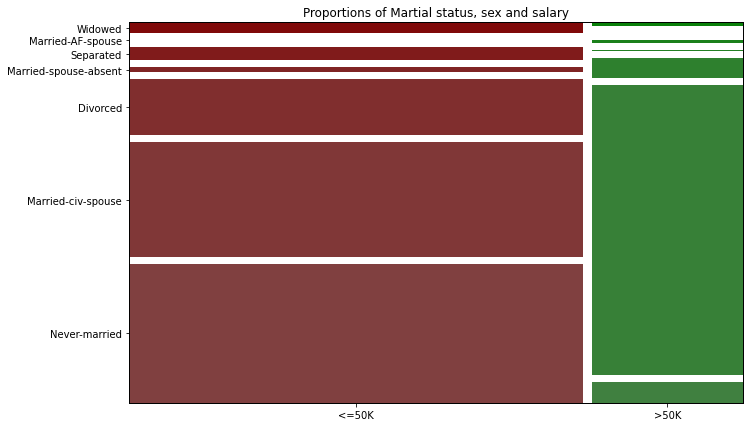

In [21]:
#4. Mosaic Plot to show the proportaions of Martial status, sex and salary
fig, ax = plt.subplots(figsize=(11, 7))
#labels = lambda key: 'Female' if 'Female' in key else 'Male'
mosaic(df,['salary','marital-status'],
       label_rotation=(0.0,0.0,0,90.0),
       ax=ax,
       axes_label=True,
       gap=[0.015,0.02, 0.015],
       labelizer=lambda key :" ",
       title='Proportions of Martial status, sex and salary')

plt.show()

Text(0.5, 0.98, 'Data distribution for hours per week')

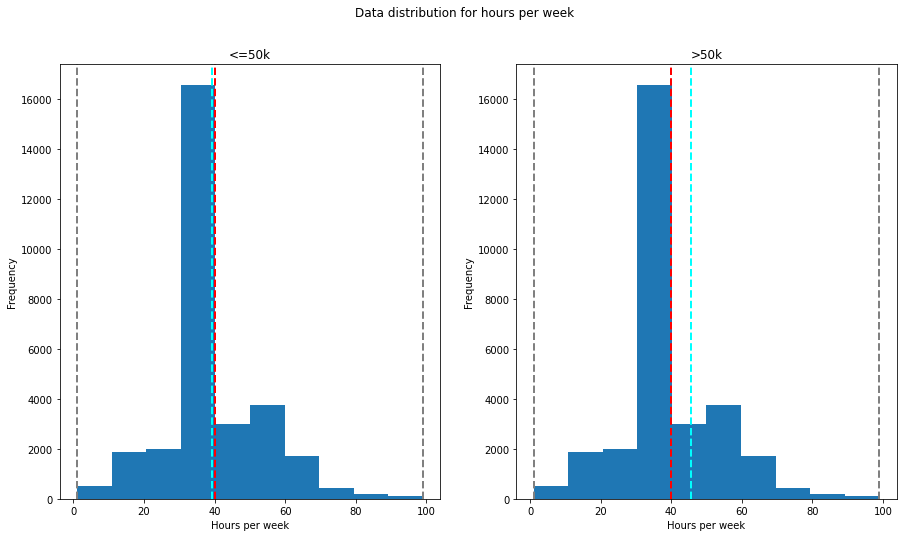

In [22]:
#5. Finding distribution for number of hours worked and salary
fig, ax = plt.subplots(1, 2, figsize = (15,8))

# Plot a histogram
ax[0].hist(df['hours-per-week'])

# Add lines for the statistics
ax[0].axvline(x=df_below50['hours-per-week'].min(), color = 'gray', linestyle='dashed', linewidth = 2)
ax[0].axvline(x=df_below50['hours-per-week'].mean(), color = 'cyan', linestyle='dashed', linewidth = 2)
ax[0].axvline(x=df_below50['hours-per-week'].median(), color = 'red', linestyle='dashed', linewidth = 2)
ax[0].axvline(x=df_below50['hours-per-week'].max(), color = 'gray', linestyle='dashed', linewidth = 2)

ax[0].set_ylabel('Frequency')
ax[0].set_xlabel('Hours per week')
ax[0].set_title('<=50k')
# Plot a histogram
ax[1].hist(df['hours-per-week'])

# Add lines for the statistics
ax[1].axvline(x=df_above50['hours-per-week'].min(), color = 'gray', linestyle='dashed', linewidth = 2)
ax[1].axvline(x=df_above50['hours-per-week'].mean(), color = 'cyan', linestyle='dashed', linewidth = 2)
ax[1].axvline(x=df_above50['hours-per-week'].median(), color = 'red', linestyle='dashed', linewidth = 2)
ax[1].axvline(x=df_above50['hours-per-week'].max(), color = 'gray', linestyle='dashed', linewidth = 2)

ax[1].set_ylabel('Frequency')
ax[1].set_title('>50k')
ax[1].set_xlabel('Hours per week')
fig.suptitle('Data distribution for hours per week')

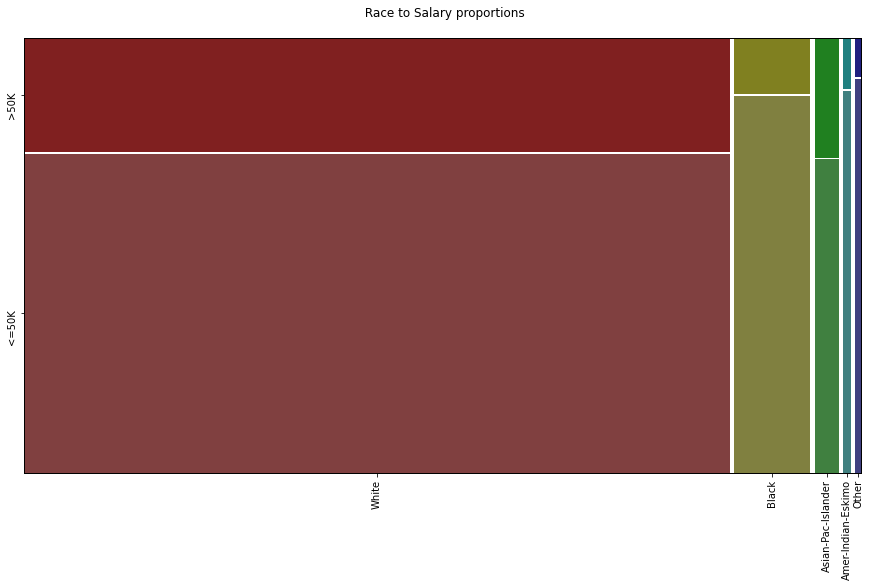

In [23]:
# 6. Race vs salary
fig, ax = plt.subplots(figsize=(15, 8))
mosaic(df, ['race','salary'],ax=ax,label_rotation=90.0,title=' Race to Salary proportions\n', labelizer= lambda k:" ")
plt.show()

Text(0.5, 0, 'Frequency')

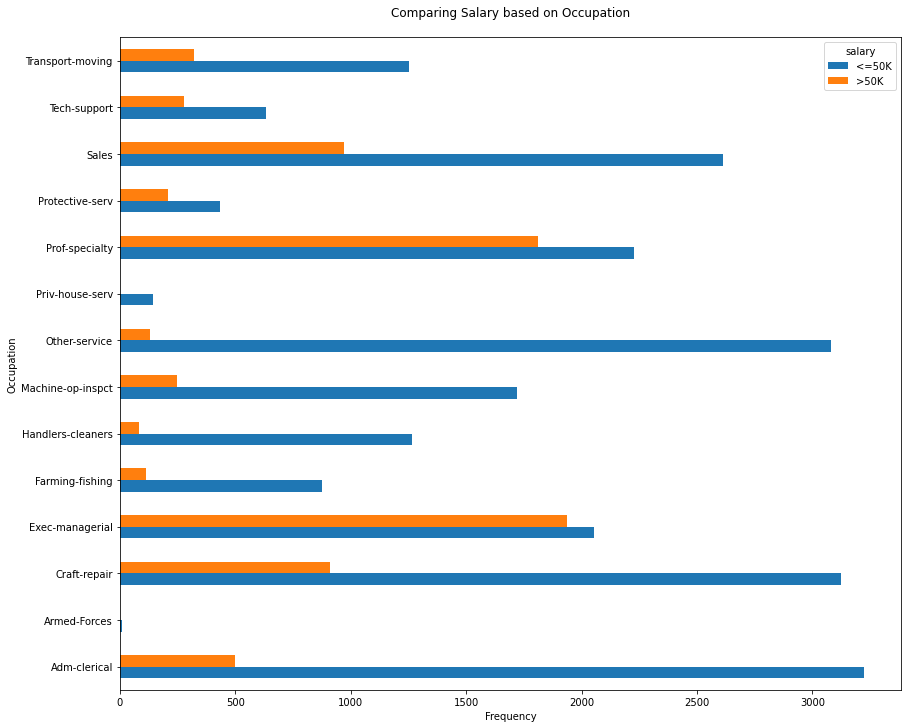

In [24]:
# 7. To compare the occupation distribution based on salary Grouped bar chart
df_1 = df.groupby(['occupation','salary']).size().to_frame('count')
df_1.reset_index().pivot_table(index="salary", columns="occupation", values="count").T.plot(kind='barh', figsize=(14, 12))
plt.title("Comparing Salary based on Occupation\n")
plt.ylabel("Occupation")
plt.xlabel("Frequency")

Text(0, 0.5, 'Frequency')

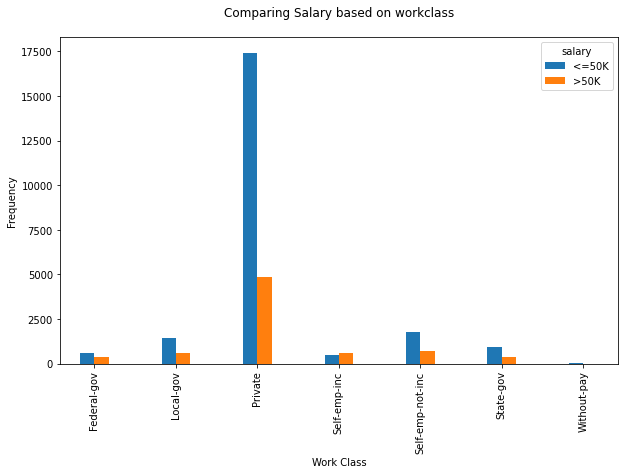

In [25]:
#8 Stacked bar charts to compare the
df_workclass = df.groupby(['workclass','salary']).size().to_frame('count')
df_workclass.reset_index().pivot_table(index="salary", columns="workclass",values="count").T.plot(kind='bar', width =0.35,figsize=(10, 6))

plt.title("Comparing Salary based on workclass\n")
plt.xlabel("Work Class")
plt.ylabel("Frequency")

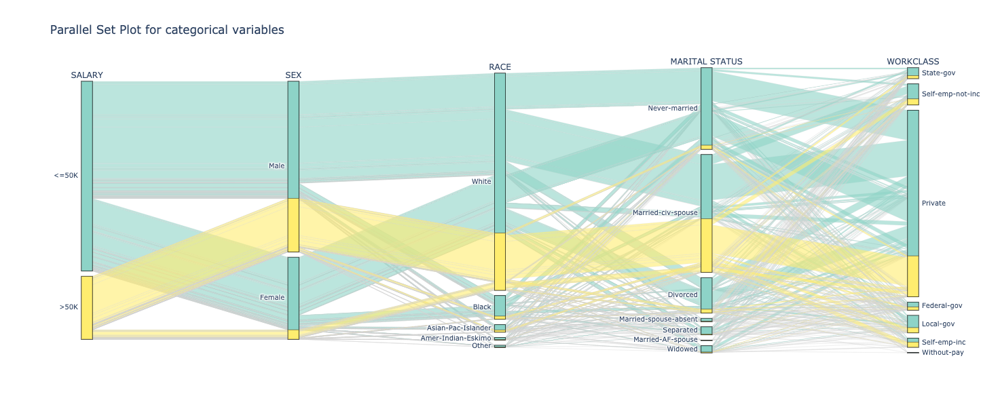

In [26]:
# 9. Shows relation between the categorical variables
# Can answer many demographic questions as this plot is an interactive graph
fig = px.parallel_categories(df, dimensions=['salary','sex','race','marital-status','workclass'],
                             color=df['salary'].apply(lambda x: 1 if x == '>50K' else 0),
                             color_continuous_scale=px.colors.qualitative.Set3,
                             width=800, height=600,
                             title="Parallel Set Plot for categorical variables",
                             labels={'salary':'SALARY', 'sex':'SEX','workclass': 'WORKCLASS', 'marital-status': 'MARITAL STATUS', 'race': 'RACE'})

fig.update_layout(coloraxis_showscale=False)
fig.show()


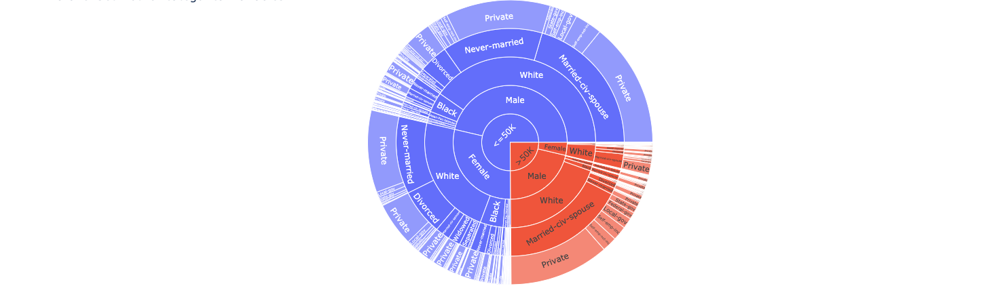

In [74]:
fig = px.sunburst(df, path=['salary','sex','race','marital-status','workclass'], color='salary', title="Parallel Set Plot for categorical variables")
# fig = px.colors.qualitative.swatches()      
fig.update_layout(
    margin = dict(t=0, l=50, r=20, b=30)
)
fig.show()
fig.write_html('adult_sunburst.html', auto_open=True)

In [27]:
df_1 = df.groupby(['occupation','salary']).size().to_frame('count')

<AxesSubplot:xlabel='occupation'>

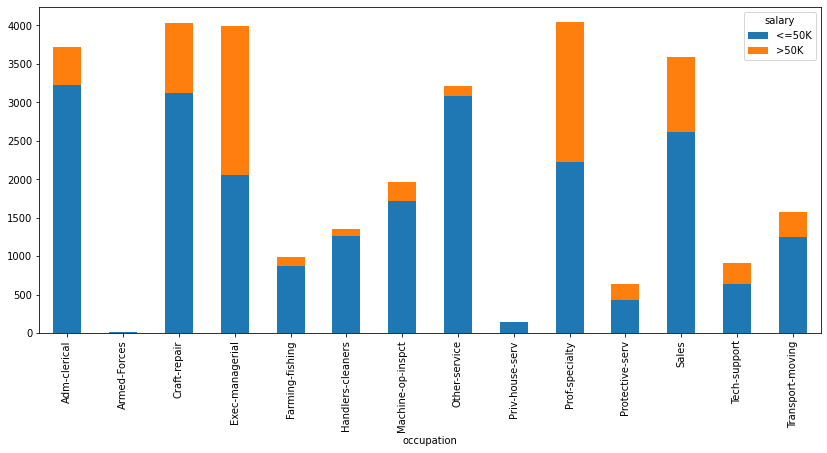

In [28]:
df_1.reset_index().pivot_table(index="salary", columns="occupation", values="count").T.plot(kind='bar', stacked=True, figsize=(14, 6))

<AxesSubplot:ylabel='occupation'>

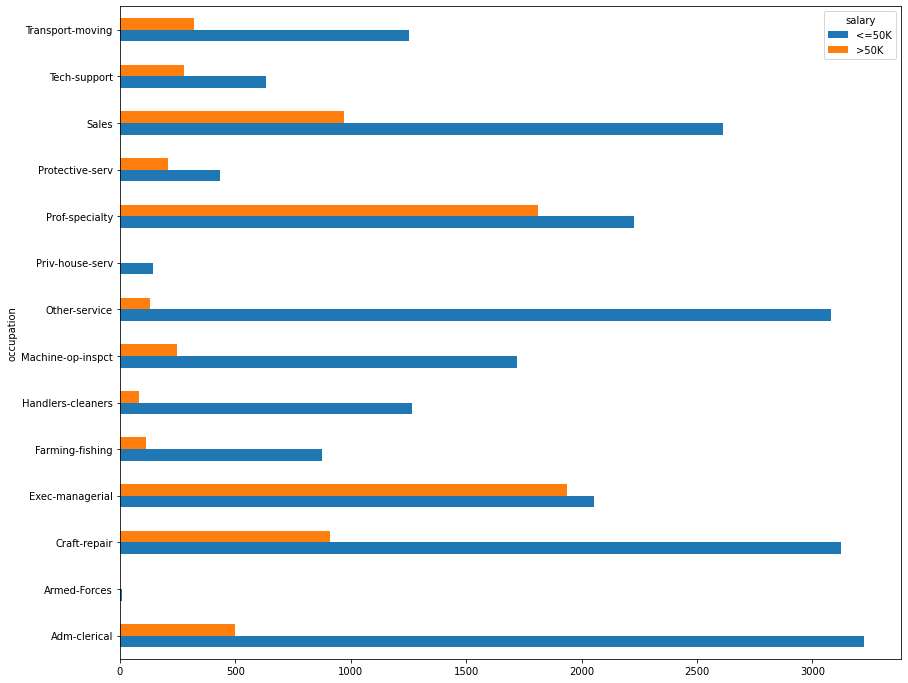

In [29]:
df_1.reset_index().pivot_table(index="salary", columns="occupation", values="count").T.plot(kind='barh', figsize=(14, 12))

Text(0.5, 0.98, 'Income distribution among Race')

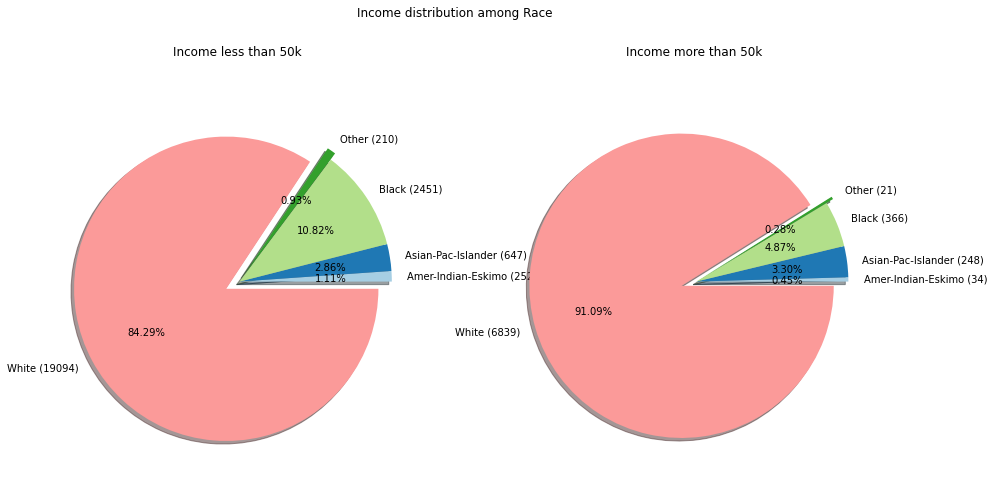

In [30]:
# 8. Pie plot to show the distribution of race in both the income groups
fig, ax = plt.subplots(1, 2, figsize = (15,8))
explode_ = (0, 0, 0, 0.05,0.1)
count_race = df_below50.groupby('race').count()

#colors_ = ['#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69','#fccde5','#2b8cbe']
colors_pop =['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
labels_ = ["{} ({})".format(i,j) for i,j in zip(count_race.index,count_race['salary']) ]
ax[0].pie(count_race['salary'],labels=labels_,explode=explode_,colors=colors_pop, autopct='%1.2f%%',shadow=True)
ax[0].set_title('Income less than 50k \n\n')

count_race = df_above50.groupby('race').count()
#colors_ = ['#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69','#fccde5','#2b8cbe']
colors_pop =['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
labels_ = ["{} ({})".format(i,j) for i,j in zip(count_race.index,count_race['salary']) ]
ax[1].pie(count_race['salary'],labels=labels_,explode=explode_,colors=colors_pop, autopct='%1.2f%%',shadow=True)
ax[1].set_title('Income more than 50k \n\n')
fig.suptitle('Income distribution among Race')

NameError: name 'x' is not defined

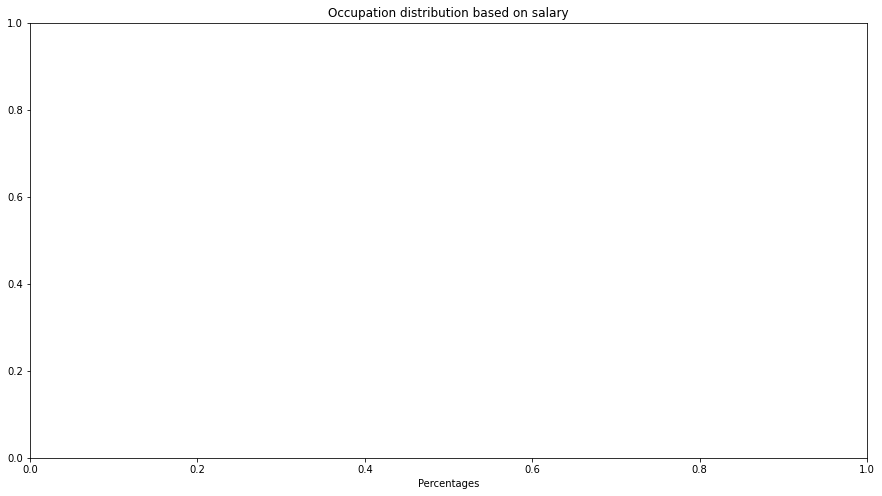

In [35]:
#7 Grouped bar charts complicated
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=(15, 8))
df_1 = df.groupby(['occupation','salary']).size().to_frame('count')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Percentages')
ax.set_title('Occupation distribution based on salary')
ax.set_yticks(x)
ax.set_yticklabels(labels_)

ax.legend()

#ax.bar_label(rects1, padding=3)
#ax.bar_label(rects2, padding=3)

fig.tight_layout()

plt.show()

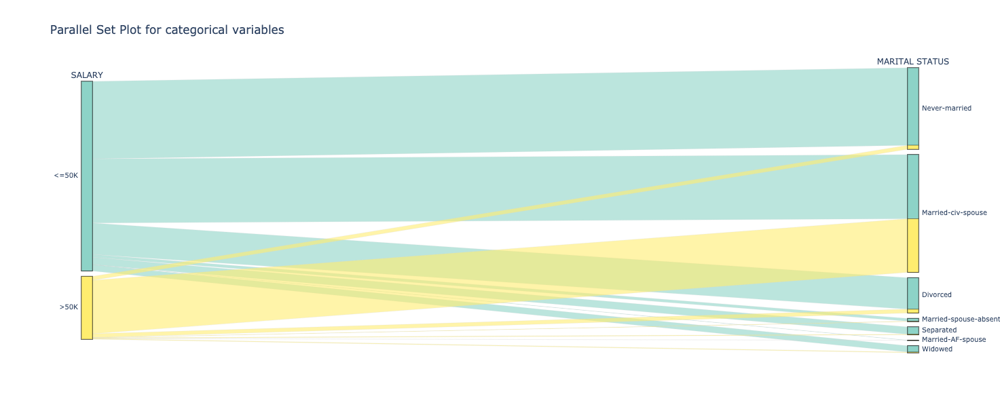

In [36]:
fig = px.parallel_categories(df, dimensions=['salary','marital-status'],
                             color=df['salary'].apply(lambda x: 1 if x == '>50K' else 0),
                             color_continuous_scale=px.colors.qualitative.Set3,
                             width=800, height=600,
                             title="Parallel Set Plot for categorical variables",
                             labels={'salary':'SALARY','marital-status': 'MARITAL STATUS'})

fig.update_layout(coloraxis_showscale=False)

fig.show()

Text(0, 0.5, 'Hours-per-week')

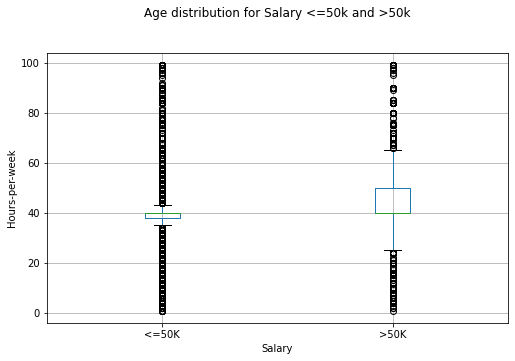

In [37]:
box_plot=df.boxplot(column='hours-per-week', by='salary', figsize=(8,5))
box_plot.get_figure().suptitle('')
box_plot.get_figure().gca().set_title("Age distribution for Salary <=50k and >50k\n\n")
box_plot.get_figure().gca().set_xlabel('Salary')
box_plot.get_figure().gca().set_ylabel('Hours-per-week')
